## Template
이 노트는 torchvision에서 pretrained model들을 적용하기 위한 베이스 코드(template)입니다.

In [1]:
#@title Import Module
import os
import cv2
import csv
import glob
import json
import random
import kagglehub
import numpy as np
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import pandas as pd
import xml.etree.ElementTree as ET

import torch
import torchvision

from collections import defaultdict
from torchvision import tv_tensors
from torchvision.transforms import v2
from torchvision.transforms import functional as F
from torch.utils.data import Dataset, DataLoader
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from torchvision.models.detection.ssd import SSD300_VGG16_Weights
from torchvision.models.detection.ssd import SSDClassificationHead
from torchvision.models.detection import _utils as det_utils
from sklearn.model_selection import train_test_split
from sklearn.metrics import average_precision_score
from PIL import Image
from tqdm import tqdm

from functools import partial

from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.fcos import FCOSClassificationHead
from torchvision.models.detection.retinanet import RetinaNetClassificationHead
from torchvision.models.detection.ssdlite import SSDLiteClassificationHead
from torchvision.models.detection.ssd import SSD300_VGG16_Weights, SSDClassificationHead
from torchvision.models.detection import (
    FCOS_ResNet50_FPN_Weights,
    FasterRCNN_MobileNet_V3_Large_320_FPN_Weights,
    FasterRCNN_MobileNet_V3_Large_FPN_Weights,
    FasterRCNN_ResNet50_FPN_V2_Weights,
    FasterRCNN_ResNet50_FPN_Weights,
    RetinaNet_ResNet50_FPN_V2_Weights,
    RetinaNet_ResNet50_FPN_Weights,
    SSDLite320_MobileNet_V3_Large_Weights,
)
from torchvision.models.detection import _utils as det_utils

In [ ]:
#@title Device 및 속도 설정
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
PIN_MEMORY = device.type == "cuda"
AMP_ENABLED = device.type == "cuda"

if AMP_ENABLED:
    # 모든 원본 이미지가 같은 크기이므로, 첫 batch 이후 더 빠른 cuDNN kernel을 사용
    torch.backends.cudnn.benchmark = True

# balanced=True: 속도를 우선하는 448px 입력. mAP가 많이 떨어지면 False로 바꾸세요.
USE_BALANCED_SPEED = False
MODEL_MIN_SIZE = 448 if USE_BALANCED_SPEED else 512
MODEL_MAX_SIZE = 640 if USE_BALANCED_SPEED else 800
NUM_EPOCHS = 100  # 기존 실행에서 최고 mAP가 epoch 19였음
VAL_EVERY = 3
TRAIN_BATCH_SIZE = 8
EVAL_BATCH_SIZE = 8
NUM_WORKERS = 0  # Windows/Jupyter 안정 기본값; 정상 완주 후 2까지 시험 가능

print(f"device: {device} | input min_size: {MODEL_MIN_SIZE}")

device: cuda | input min_size: 512


In [3]:
#@title Image, Annotation 경로 설정
kagglehub.login()
path = kagglehub.competition_download("ai14-level-project")
path = os.path.join(path, "sprint_ai_project1_data")
print(path)

image_dir = glob.glob(os.path.join(path, "train_images", "*.png"))

annotation_dir = glob.glob(
    os.path.join(path, "train_annotations", "**", "*.json"),
    recursive=True
)

print(f"Train 이미지 수 : {len(image_dir)}, Annotation 수 : {len(annotation_dir)}")

C:\Users\yiydg\.cache\kagglehub\competitions\ai14-level-project\sprint_ai_project1_data
Train 이미지 수 : 232, Annotation 수 : 763


In [4]:
#Cell 4 수정(1:1 mapping 코드 -> 1:n mapping 코드)
#@title Image-Annotation Mapping (stem 기준)

# 이미지 stem -> 이미지 경로
image_stem_to_path = {
    os.path.splitext(os.path.basename(image_path))[0]: image_path
    for image_path in image_dir
}

# 이미지 stem -> 여러 annotation JSON 경로
stem_to_paths = defaultdict(list)

for annotation_path in annotation_dir:
    stem = os.path.splitext(os.path.basename(annotation_path))[0]
    stem_to_paths[stem].append(annotation_path)

# 이미지와 annotation이 모두 존재하는 stem만 사용
valid_stems = [
    stem
    for stem in stem_to_paths
    if stem in image_stem_to_path
]

# 매핑되지 않는 데이터 확인
images_without_annotation = (
    set(image_stem_to_path) - set(stem_to_paths)
)

annotations_without_image = (
    set(stem_to_paths) - set(image_stem_to_path)
)

print(f"Annotation이 없는 Train 이미지 수: {len(images_without_annotation)}")
print(f"Train 이미지가 없는 Annotation stem 수: {len(annotations_without_image)}")
print(f"매핑 가능한 이미지 수: {len(valid_stems)}")

Annotation이 없는 Train 이미지 수: 0
Train 이미지가 없는 Annotation stem 수: 0
매핑 가능한 이미지 수: 232


In [5]:
#@title Annotation 경로 매핑 (stem -> 여러 파일)
avg_per_stem = sum(len(v) for v in stem_to_paths.values()) / len(stem_to_paths)

print(
    f"고유 이미지 수: {len(stem_to_paths)}, "
    f"이미지당 평균 annotation 파일 수: {avg_per_stem:.2f}"
)

고유 이미지 수: 232, 이미지당 평균 annotation 파일 수: 3.29


In [6]:
# #@title Image-Annotation Mapping

# # Train 이미지에 해당하지 않는 Annotation 개수 확인
# annotation_not_in_train_image = []
# for image_path in image_dir:
#     image_name = os.path.basename(image_path)
#     annotation_name = image_name.replace(".png", ".json")
#     if annotation_name not in [os.path.basename(annotation_path) for annotation_path in annotation_dir]:
#         annotation_not_in_train_image.append(image_name)

# print(f"Annotation에 해당하지 않는 Train 이미지 개수: {len(annotation_not_in_train_image)}")

# # Annotation 에 없는 Train 이미지 개수 확인
# train_image_not_in_annotation = []
# for annotation_path in annotation_dir:
#     annotation_name = os.path.basename(annotation_path)
#     image_name = annotation_name.replace(".json", ".png")
#     if image_name not in [os.path.basename(image_path) for image_path in image_dir]:
#         train_image_not_in_annotation.append(annotation_name)

# print(f"Train 이미지에 해당하지 않는 Annotation 개수: {len(train_image_not_in_annotation)}")

# # Train 이미지와 Annotation 매핑 가능한 데이터 수
# image_annotation_mapping = {}
# for image_path in image_dir:
#     image_name = os.path.basename(image_path)
#     annotation_name = image_name.replace(".png", ".json")
#     if annotation_name in [os.path.basename(annotation_path) for annotation_path in annotation_dir]:
#         image_annotation_mapping[image_name] = annotation_name

# print(f"Train 이미지와 Annotation 매핑 가능한 데이터 수: {len(image_annotation_mapping)}")

# # Image - Annotation Mapping을 위한 코드
# image_names = [os.path.basename(image_path) for image_path in image_dir]
# annotation_names = [os.path.basename(annotation_path) for annotation_path in annotation_dir]

# image_annotation_mapping_process = {}
# for image_name in image_names:
#     annotation_name = image_name.replace(".png", ".json")
#     if annotation_name in annotation_names:
#         image_annotation_mapping_process[image_name] = annotation_name

In [7]:
#@title 이미지 단위 Annotation 병합

def build_image_records(valid_stems, stem_to_paths):
    image_records = {}
    category_id_to_name = {}

    for stem in valid_stems:
        img_info = None
        annotations = []

        for annotation_path in stem_to_paths[stem]:
            with open(annotation_path, "r", encoding="utf-8") as f:
                data = json.load(f)

            # 이미지 정보는 같은 stem의 JSON끼리 동일하므로 처음 한 번만 저장
            if img_info is None:
                img_info = data["images"][0]

            # 클래스 정보 저장
            for category in data["categories"]:
                category_id_to_name[category["id"]] = category["name"]

            # 같은 이미지에 속한 annotation들을 하나로 병합
            for ann in data["annotations"]:
                annotations.append({
                    "bbox": ann["bbox"],
                    "category_id": ann["category_id"],
                    "area": ann["area"],
                    "iscrowd": ann.get("iscrowd", 0)
                })

        image_records[stem] = {
            "file_name": img_info["file_name"],
            "width": img_info["width"],
            "height": img_info["height"],
            "annotations": annotations
        }

    return image_records, category_id_to_name


image_records, category_id_to_name = build_image_records(
    valid_stems,
    stem_to_paths
)

print(f"이미지 record 수: {len(image_records)}")
print(f"클래스 수: {len(category_id_to_name)}")

이미지 record 수: 232
클래스 수: 56


In [8]:
#@title 이미지 해상도 파악
sizes = set()
for img_path in image_dir[:50]:  # 200장이면 전수 조사해도 됨: image_dir 전체로
    with Image.open(img_path) as im:
        sizes.add(im.size)  # (width, height)

print(f"고유 해상도 종류 수: {len(sizes)}")
print(sizes if len(sizes) < 10 else list(sizes)[:10])

고유 해상도 종류 수: 1
{(976, 1280)}


In [9]:
# #@title Annotation 경로 매핑 (중복 대응)
# annotation_path_by_stem = {}
# duplicate_mismatch = []

# for ann_path in annotation_dir:
#     stem = os.path.splitext(os.path.basename(ann_path))[0]
#     if stem in annotation_path_by_stem:
#         # 중복 파일이 내용까지 같은지 확인
#         with open(annotation_path_by_stem[stem], "r", encoding="utf-8") as f1, open(ann_path, "r", encoding="utf-8") as f2:
#             if f1.read() != f2.read():
#                 duplicate_mismatch.append(stem)
#     else:
#         annotation_path_by_stem[stem] = ann_path

# print(f"고유 annotation stem 수: {len(annotation_path_by_stem)}")
# print(f"내용이 다른 중복 파일 수: {len(duplicate_mismatch)}")
# if duplicate_mismatch:
#     print("확인 필요:", duplicate_mismatch[:10])

In [10]:
# #@title 중복 annotation 내용 진단
# stem_to_paths = defaultdict(list)
# for ann_path in annotation_dir:
#     stem = os.path.splitext(os.path.basename(ann_path))[0]
#     stem_to_paths[stem].append(ann_path)

# # 확인 필요 목록 중 하나 골라서 상세 비교
# sample_stem = "K-003351-016232-033880_0_2_0_2_75_000_200"
# sample_paths = stem_to_paths[sample_stem]

# print(f"'{sample_stem}' 관련 파일 개수: {len(sample_paths)}")
# for p in sample_paths:
#     with open(p, "r", encoding="utf-8") as f:
#         data = json.load(f)
#     ann_summaries = [(a["id"], a["category_id"], a["bbox"]) for a in data["annotations"]]
#     cat_names = [c["name"] for c in data["categories"]]
#     print("---")
#     print("경로:", p)
#     print("categories:", cat_names)
#     print("annotations (id, category_id, bbox):", ann_summaries)

In [11]:
# #@title Annotation 경로 매핑 (stem -> 여러 파일)
# stem_to_paths = defaultdict(list)
# for ann_path in annotation_dir:
#     stem = os.path.splitext(os.path.basename(ann_path))[0]
#     stem_to_paths[stem].append(ann_path)

# avg_per_stem = sum(len(v) for v in stem_to_paths.values()) / len(stem_to_paths)
# print(f"고유 이미지 수: {len(stem_to_paths)}, 이미지당 평균 annotation 파일 수: {avg_per_stem:.2f}")

In [12]:
# #@title Check Unique Image Size
# shapes = set()

# for img_path in image_dir:  # 이미 전체 경로이므로 그대로 사용
#     img_pil = Image.open(img_path)
#     img_np = np.array(img_pil)
#     shapes.add(img_np.shape)

# print(f"Unique Image Shapes ({len(shapes)}종류):")
# for s in shapes:
#     print(s)

In [13]:
# #@title 폴더별 partial annotation 병합
def load_merged_annotation(paths):
    img_info = None
    boxes, labels, areas, iscrowd = [], [], [], []

    for p in paths:
        with open(p, "r", encoding="utf-8") as f:
            data = json.load(f)

        if img_info is None:
            img_info = data["images"][0]  # width/height/file_name은 모든 폴더에서 동일하다고 가정

        for ann in data["annotations"]:
            boxes.append(ann["bbox"])       # [x, y, w, h]
            labels.append(ann["category_id"])
            areas.append(ann["area"])
            iscrowd.append(ann.get("iscrowd", 0))

    return img_info, boxes, labels, areas, iscrowd

In [14]:
# #@title 이미지 해상도 파악
# sizes = set()
# for img_path in image_dir[:50]:  # 200장이면 전수 조사해도 됨: image_dir 전체로
#     with Image.open(img_path) as im:
#         sizes.add(im.size)  # (width, height)

# print(f"고유 해상도 종류 수: {len(sizes)}")
# print(sizes if len(sizes) < 10 else list(sizes)[:10])

In [15]:
#@title Transformer
train_transformer = v2.Compose([
    v2.ToImage(),
    v2.ToDtype(dtype=torch.float32, scale=True),
    v2.RandomHorizontalFlip(p=0.5),
])

val_test_transformer = v2.Compose([
    v2.ToImage(),
    v2.ToDtype(dtype=torch.float32, scale=True),
])

In [16]:
from collections import Counter, defaultdict

class_instance_count = Counter()      # 클래스별 annotation(알약 객체) 개수
class_image_count = defaultdict(set)  # 클래스별 등장하는 이미지(stem) 집합

for stem, paths in stem_to_paths.items():
    img_info, raw_boxes, raw_labels, areas, iscrowd = load_merged_annotation(paths)
    for cid in raw_labels:
        class_instance_count[cid] += 1
        class_image_count[cid].add(stem)

print(f"Train 데이터에 존재하는 고유 클래스 수: {len(class_instance_count)}\n")

for cid in sorted(class_instance_count.keys()):
    name = category_id_to_name[cid]
    print(f"category_id: {cid:>6} | 이름: {name:<20} | "
          f"객체 수: {class_instance_count[cid]:>4} | "
          f"등장 이미지 수: {len(class_image_count[cid]):>4}")

Train 데이터에 존재하는 고유 클래스 수: 56

category_id:   1900 | 이름: 보령부스파정 5mg           | 객체 수:   15 | 등장 이미지 수:   15
category_id:   2483 | 이름: 뮤테란캡슐 100mg          | 객체 수:    9 | 등장 이미지 수:    9
category_id:   3351 | 이름: 일양하이트린정 2mg          | 객체 수:  153 | 등장 이미지 수:  153
category_id:   3483 | 이름: 기넥신에프정(은행엽엑스)(수출용)   | 객체 수:   45 | 등장 이미지 수:   45
category_id:   3544 | 이름: 무코스타정(레바미피드)(비매품)    | 객체 수:    6 | 등장 이미지 수:    6
category_id:   3743 | 이름: 알드린정                 | 객체 수:    3 | 등장 이미지 수:    3
category_id:   3832 | 이름: 뉴로메드정(옥시라세탐)         | 객체 수:   20 | 등장 이미지 수:   20
category_id:   4543 | 이름: 에어탈정(아세클로페낙)         | 객체 수:    5 | 등장 이미지 수:    5
category_id:  12081 | 이름: 리렉스펜정 300mg/PTP      | 객체 수:    3 | 등장 이미지 수:    3
category_id:  12247 | 이름: 아빌리파이정 10mg          | 객체 수:    3 | 등장 이미지 수:    3
category_id:  12778 | 이름: 다보타민큐정 10mg/병        | 객체 수:    6 | 등장 이미지 수:    6
category_id:  13395 | 이름: 써스펜8시간이알서방정 650mg    | 객체 수:    3 | 등장 이미지 수:    3
category_id:  13900 | 이름: 에빅사정(메만틴염산염)(비매품)   

In [17]:
import pandas as pd

df = pd.DataFrame([
    {
        "category_id": cid,
        "name": category_id_to_name[cid],
        "instance_count": class_instance_count[cid],
        "image_count": len(class_image_count[cid])
    }
    for cid in sorted(class_instance_count.keys())
])
df = df.sort_values("instance_count", ascending=False).reset_index(drop=True)
df

,category_id,name,instance_count,image_count
0,3351,일양하이트린정 2mg,153,153
1,3483,기넥신에프정(은행엽엑스)(수출용),45,45
2,35206,아토젯정 10/40mg,37,37
3,16262,크레스토정 20mg,23,23
4,21325,아토르바정 10mg,22,22
5,16232,리피토정 20mg,21,21
6,3832,뉴로메드정(옥시라세탐),20,20
7,20238,플라빅스정 75mg,20,20
8,36637,로수젯정10/5밀리그램,19,19
9,16548,가바토파정 100mg,18,18


In [18]:
#@title 클래스(category) 매핑 생성
sorted_ids = sorted(category_id_to_name.keys())

category_to_label = {
    cid: i + 1
    for i, cid in enumerate(sorted_ids)
}

label_to_category = {
    v: k
    for k, v in category_to_label.items()
}

classes = ["background"] + [
    category_id_to_name[cid]
    for cid in sorted_ids
]

num_classes = len(classes)

print(f"클래스 수(background 포함): {num_classes}")

클래스 수(background 포함): 57


In [19]:
#@title 클래스(category) 매핑 생성
def build_category_mapping(annotation_paths):
    category_id_to_name = {}
    for path in annotation_paths:
        with open(path, "r", encoding="utf-8") as f:
            data = json.load(f)
        for cat in data["categories"]:
            category_id_to_name[cat["id"]] = cat["name"]
    return category_id_to_name

category_id_to_name = build_category_mapping(annotation_dir)  # annotation_dir: glob으로 뽑은 json 경로 리스트
sorted_ids = sorted(category_id_to_name.keys())

category_to_label = {cid: i + 1 for i, cid in enumerate(sorted_ids)}  # 0 = background
label_to_category = {v: k for k, v in category_to_label.items()}
classes = ["background"] + [category_id_to_name[cid] for cid in sorted_ids]
num_classes = len(classes)

print(f"클래스 수(background 포함): {num_classes}")

클래스 수(background 포함): 57


In [20]:
#@title Pill Dataset 정의

class PillDataset(Dataset):
    def __init__(
        self,
        image_dir,
        image_records,
        stems,
        category_to_label,
        transforms=None
    ):
        self.image_dir = image_dir
        self.image_records = image_records
        self.stems = stems
        self.category_to_label = category_to_label
        self.transforms = transforms

    def __len__(self):
        return len(self.stems)

    def __getitem__(self, idx):
        stem = self.stems[idx]

        # 미리 병합해둔 annotation 정보 가져오기
        record = self.image_records[stem]

        with Image.open(os.path.join(self.image_dir, record["file_name"])) as im:
            image = im.convert("RGB")

        w = record["width"]
        h = record["height"]

        boxes = []
        labels = []
        areas = []
        iscrowd = []

        for ann in record["annotations"]:
            x, y, bw, bh = ann["bbox"]

            boxes.append([x, y, x + bw, y + bh])
            labels.append(
                self.category_to_label[ann["category_id"]]
            )
            areas.append(ann["area"])
            iscrowd.append(ann["iscrowd"])

        image = tv_tensors.Image(image)

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        boxes = boxes.reshape(-1, 4) if boxes.numel() else boxes.reshape(0, 4)
        boxes = tv_tensors.BoundingBoxes(
            boxes,
            format="XYXY",
            canvas_size=(h, w)
        )

        target = {
            "boxes": boxes,
            "labels": torch.as_tensor(labels, dtype=torch.int64),
            "image_id": torch.tensor([idx]),
            "area": torch.as_tensor(areas, dtype=torch.float32),
            "iscrowd": torch.as_tensor(iscrowd, dtype=torch.int64),
        }

        if self.transforms:
            image, target = self.transforms(image, target)

        return image, target

In [21]:
#@title Dataset ~ DataLoader
stems = list(image_records.keys())

train_stems, valid_stems = train_test_split(
    stems, test_size=0.2, random_state=42
)

train_dataset = PillDataset(
    image_dir=os.path.join(path, "train_images"),
    image_records=image_records, stems=train_stems,
    category_to_label=category_to_label, transforms=train_transformer,
)
valid_dataset = PillDataset(
    image_dir=os.path.join(path, "train_images"),
    image_records=image_records, stems=valid_stems,
    category_to_label=category_to_label, transforms=val_test_transformer,
)

# lambda를 쓰지 않아 Windows multiprocessing에서도 pickle 오류를 피함
def detection_collate_fn(batch):
    return tuple(zip(*batch))

def make_detection_loader(dataset, batch_size, shuffle):
    kwargs = dict(
        dataset=dataset, batch_size=batch_size, shuffle=shuffle,
        collate_fn=detection_collate_fn, num_workers=NUM_WORKERS,
        pin_memory=PIN_MEMORY,
    )
    if NUM_WORKERS > 0:
        kwargs.update(persistent_workers=True, prefetch_factor=2)
    return DataLoader(**kwargs)

train_loader = make_detection_loader(train_dataset, TRAIN_BATCH_SIZE, shuffle=True)
val_loader = make_detection_loader(valid_dataset, EVAL_BATCH_SIZE, shuffle=False)

In [22]:
#@title Faster R-CNN 모델 설정
model = torchvision.models.detection.fasterrcnn_resnet50_fpn_v2(
    weights=FasterRCNN_ResNet50_FPN_V2_Weights.DEFAULT,
    min_size=MODEL_MIN_SIZE,
    max_size=MODEL_MAX_SIZE,
    rpn_pre_nms_top_n_train=1000,
    rpn_post_nms_top_n_train=1000,
    box_detections_per_img=20,
).to(device)

in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(
    in_features,
    num_classes
).to(device)

CHECKPOINT_PATH = "best_model_fasterrcnn_resnet50_fpn_v2_fast.pth"

In [23]:
#@title Define Optimizer & Scheduler
optimizer = torch.optim.SGD(model.parameters(), lr = 3e-3, momentum=0.9, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="max",
    factor=0.5,
    patience=4,
)

In [24]:
#@title mAP 계산 함수 (IoU threshold 0.75~0.95)
iou_thresholds = [0.75, 0.80, 0.85, 0.90, 0.95]

def evaluate_map(model, data_loader, device):
    was_training = model.training
    model.eval()
    metric = MeanAveragePrecision(iou_type="bbox", iou_thresholds=iou_thresholds)

    # evaluation도 AMP를 사용하면 validation 시간이 크게 줄어듭니다.
    with torch.inference_mode(), torch.cuda.amp.autocast(enabled=AMP_ENABLED):
        for images, targets in tqdm(data_loader, desc="Evaluating"):
            images = [img.to(device, non_blocking=PIN_MEMORY) for img in images]
            preds = model(images)

            preds_cpu = [
                {
                    "boxes": p["boxes"].float().cpu(),
                    "scores": p["scores"].float().cpu(),
                    "labels": p["labels"].cpu(),
                }
                for p in preds
            ]
            targets_cpu = [{"boxes": t["boxes"].cpu(), "labels": t["labels"].cpu()} for t in targets]

            metric.update(preds_cpu, targets_cpu)

    result = metric.compute()
    if was_training:
        model.train()
    return result

In [ ]:
num_epochs = NUM_EPOCHS
best_map = float("-inf")  # mAP가 0이어도 첫 checkpoint는 저장
train_loss_hist = []
val_map_hist = []
val_map_75_hist = []
val_epoch_hist = []

scaler = torch.cuda.amp.GradScaler(enabled=AMP_ENABLED)

for epoch in range(num_epochs):
    model.train()
    total_train_loss = 0.0

    for images, targets in tqdm(train_loader, desc=f"Epoch {epoch+1} Training"):
        images = [img.to(device, non_blocking=PIN_MEMORY) for img in images]
        targets = [
            {k: v.to(device, non_blocking=PIN_MEMORY) for k, v in t.items()}
            for t in targets
        ]

        optimizer.zero_grad(set_to_none=True)
        with torch.cuda.amp.autocast(enabled=AMP_ENABLED):
            loss_dict = model(images, targets)
            losses = sum(loss_dict.values())

        scaler.scale(losses).backward()
        scaler.step(optimizer)
        scaler.update()

        total_train_loss += losses.item()

    avg_train_loss = total_train_loss / len(train_loader)
    train_loss_hist.append(avg_train_loss)

    print(f"Epoch {epoch + 1}/{num_epochs} | Train Loss: {avg_train_loss:.4f}")

    val_map = evaluate_map(model, val_loader, device)
    current_map = val_map["map"].item()
    current_map_75 = val_map["map_75"].item()
    lr_scheduler.step(current_map)

    val_epoch_hist.append(epoch + 1)
    val_map_hist.append(current_map)
    val_map_75_hist.append(current_map_75)
    print(
        f"Epoch {epoch + 1}/{num_epochs} | "
        f"Train Loss: {avg_train_loss:.4f} | "
        f"mAP[.75:.95]: {current_map:.4f} | "
        f"mAP@75: {current_map_75:.4f}"
    )

    if current_map > best_map:
        best_map = current_map
        torch.save({
            "epoch": epoch + 1,
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "scheduler_state_dict": lr_scheduler.state_dict(),
            "best_map": best_map,
        }, CHECKPOINT_PATH)
        print(f"  → New best model saved (mAP: {best_map:.4f})")

C:\Users\yiydg\AppData\Local\Temp\ipykernel_22404\3662354143.py:8: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=AMP_ENABLED)


KeyError: 'model_state_dict'

In [26]:
#@title Test 이미지 경로 설정 및 랜덤 샘플링
test_image_dir = glob.glob(os.path.join(path, "test_images", "*.png"))
print(f"Test 이미지 수: {len(test_image_dir)}")

random.seed(42)
test_sample_paths = random.sample(test_image_dir, min(20, len(test_image_dir)))
test_sample_stems = [os.path.splitext(os.path.basename(p))[0] for p in test_sample_paths]

Test 이미지 수: 842


In [27]:
class TestDataset(Dataset):
    def __init__(self, image_dir, stems, transforms):
        self.image_dir = image_dir
        self.stems = stems
        self.transforms = transforms

    def __len__(self):
        return len(self.stems)

    def __getitem__(self, idx):
        stem = self.stems[idx]

        image = Image.open(
            os.path.join(self.image_dir, f"{stem}.png")
        ).convert("RGB")

        orig_w, orig_h = image.size
        image = tv_tensors.Image(image)

        if self.transforms:
            image = self.transforms(image)

        return image, stem, orig_w, orig_h


test_dataset = TestDataset(
    image_dir=os.path.join(path, "test_images"),
    stems=test_sample_stems,
    transforms=val_test_transformer,
)

test_loader = make_detection_loader(
    test_dataset, batch_size=4, shuffle=False
)

In [28]:
#@title Define method : visualize_prediction
def visualize_prediction(image, prediction, classes, score_thresh=0.5):
    """
    image (torch.Tensor): 추론에 사용된 이미지 (C, H, W).
    prediction (dict): boxes, labels, scores 포함.
    classes (list): index -> 약 이름 매핑 리스트 (0번 = background).
    """
    image = image.permute(1, 2, 0).cpu().numpy()

    fig, ax = plt.subplots(1, figsize=(8, 8))
    ax.imshow(image)

    for box, label, score in zip(prediction["boxes"], prediction["labels"], prediction["scores"]):
        if score > score_thresh:
            x_min, y_min, x_max, y_max = box.tolist()
            width, height = x_max - x_min, y_max - y_min

            rect = patches.Rectangle(
                (x_min, y_min), width, height,
                linewidth=2, edgecolor="red", facecolor="none"
            )
            ax.add_patch(rect)
            ax.text(
                x_min, max(y_min - 5, 0),
                f"{classes[label.item()]} ({score:.2f})",
                color="white", fontsize=9,
                bbox=dict(facecolor="red", alpha=0.6, pad=1)
            )

    ax.axis("off")
    plt.show()

C:\Users\yiydg\AppData\Local\Temp\ipykernel_22404\3726485502.py:5: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.inference_mode(), torch.cuda.amp.autocast(enabled=AMP_ENABLED):
Test Inference:   0%|          | 0/5 [00:00<?, ?it/s]

파일명: 68


c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 44592 (\N{HANGUL SYLLABLE GI}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 45349 (\N{HANGUL SYLLABLE NEG}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 49888 (\N{HANGUL SYLLABLE SIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 50640 (\N{HANGUL SYLLABLE E}) missing from fo

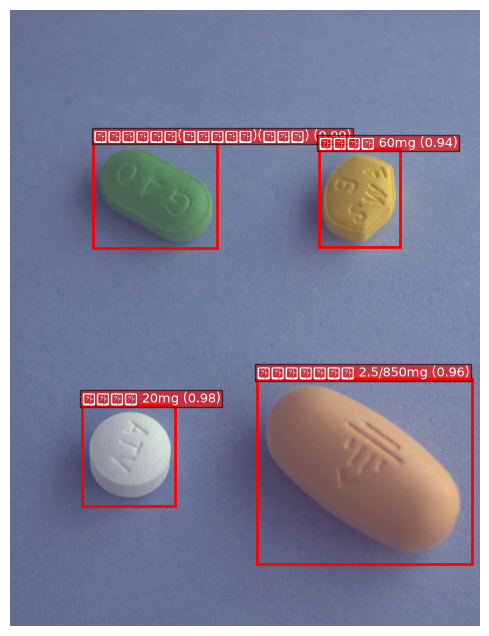

파일명: 1174


c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 48148 (\N{HANGUL SYLLABLE BA}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 47196 (\N{HANGUL SYLLABLE RO}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 44544 (\N{HANGUL SYLLABLE GEUL}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 47549 (\N{HANGUL SYLLABLE RIB}) missing from 

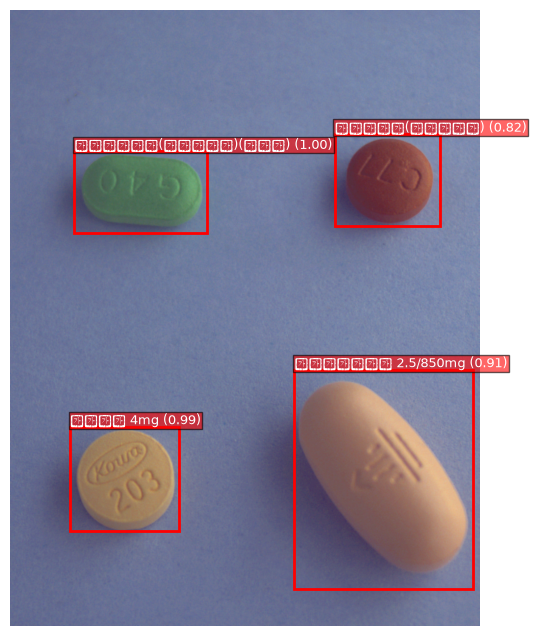

파일명: 1029


c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 51068 (\N{HANGUL SYLLABLE IL}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 50577 (\N{HANGUL SYLLABLE YANG}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 54616 (\N{HANGUL SYLLABLE HA}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 51060 (\N{HANGUL SYLLABLE I}) missing from fo

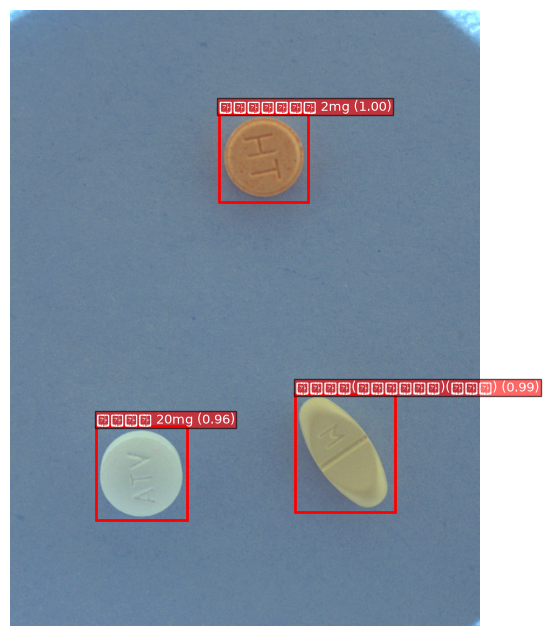

파일명: 875


c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 54252 (\N{HANGUL SYLLABLE PO}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 51648 (\N{HANGUL SYLLABLE JI}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 51088 (\N{HANGUL SYLLABLE JA}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 45572 (\N{HANGUL SYLLABLE NU}) missing from fon

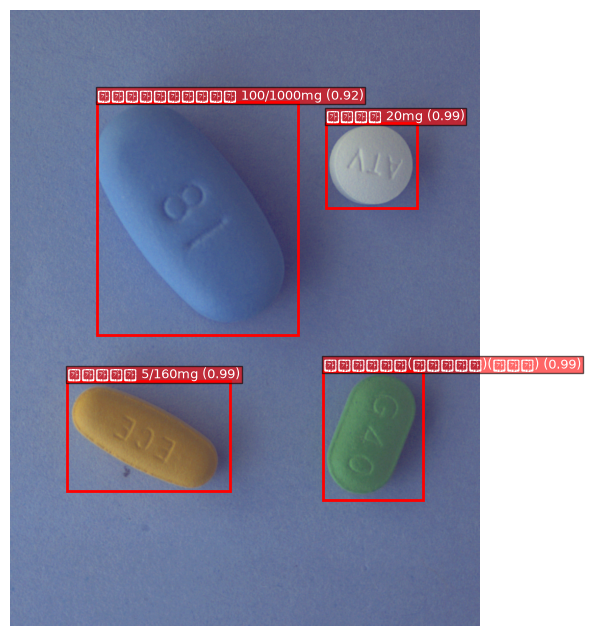

Test Inference:  20%|██        | 1/5 [00:04<00:17,  4.37s/it]

파일명: 1449


c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 47112 (\N{HANGUL SYLLABLE RE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 47924 (\N{HANGUL SYLLABLE MU}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 53076 (\N{HANGUL SYLLABLE KO}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 48120 (\N{HANGUL SYLLABLE MI}) missing from fon

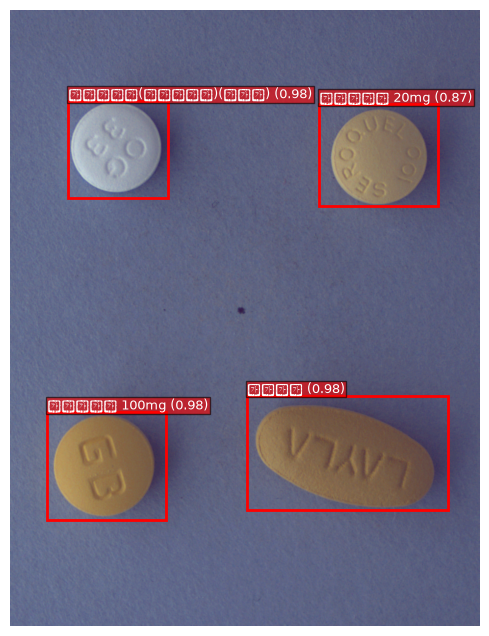

파일명: 1393


c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 54540 (\N{HANGUL SYLLABLE PEUL}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 50500 (\N{HANGUL SYLLABLE A}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


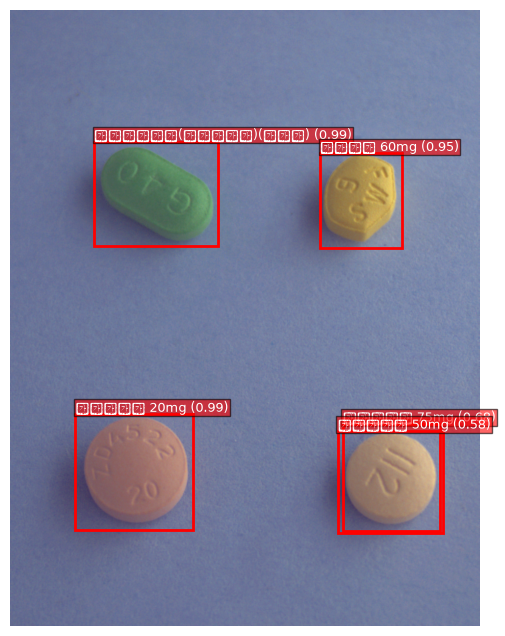

파일명: 1358


c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 50612 (\N{HANGUL SYLLABLE EO}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 53448 (\N{HANGUL SYLLABLE TAL}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 49464 (\N{HANGUL SYLLABLE SE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 53364 (\N{HANGUL SYLLABLE KEUL}) missing from 

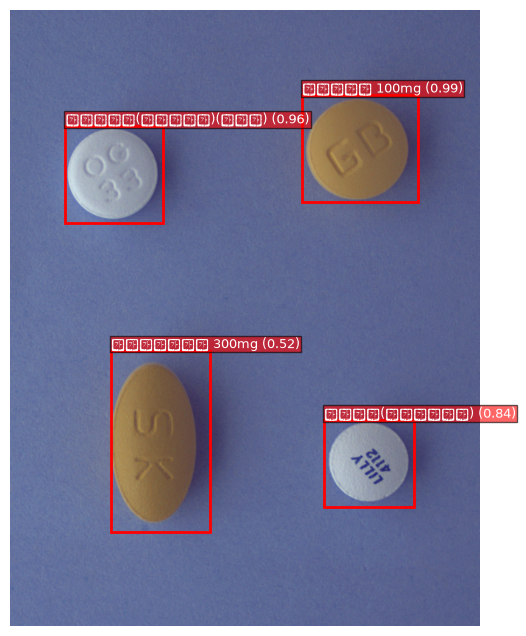

파일명: 1214


c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 48036 (\N{HANGUL SYLLABLE MYU}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 53580 (\N{HANGUL SYLLABLE TE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 46976 (\N{HANGUL SYLLABLE RAN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 52897 (\N{HANGUL SYLLABLE KAEB}) missing from

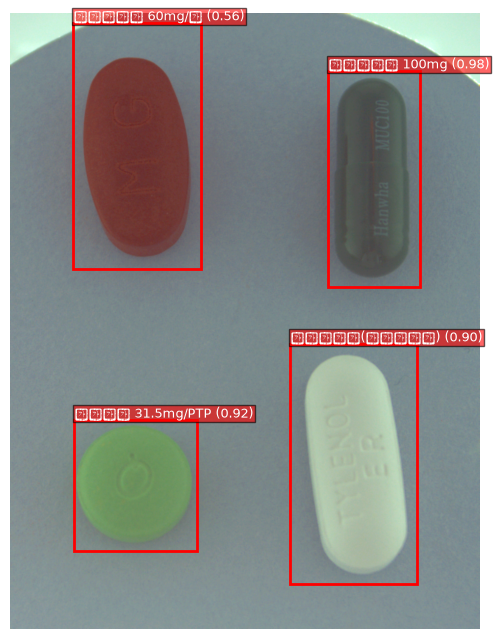

Test Inference:  40%|████      | 2/5 [00:06<00:09,  3.28s/it]

파일명: 868


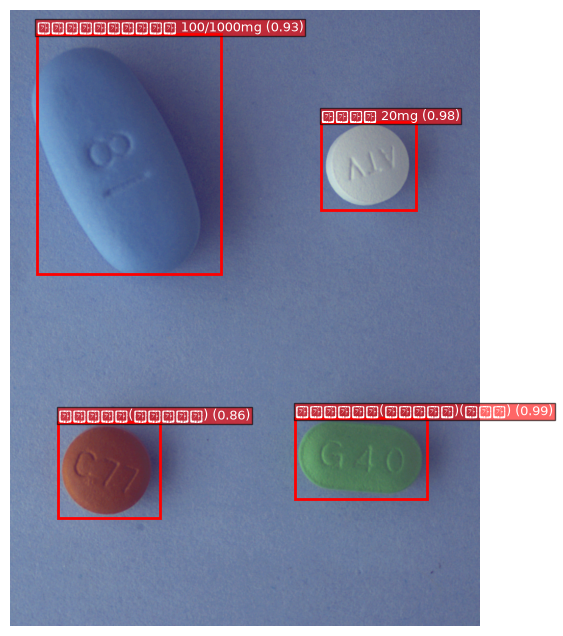

파일명: 1159


c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 51333 (\N{HANGUL SYLLABLE JONG}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 44540 (\N{HANGUL SYLLABLE GEUN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 45817 (\N{HANGUL SYLLABLE DANG}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 54000 (\N{HANGUL SYLLABLE TI}) missing fr

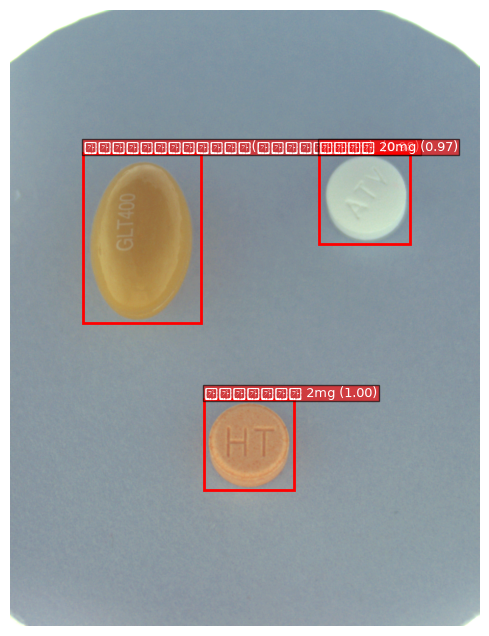

파일명: 742


c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 51247 (\N{HANGUL SYLLABLE JES}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


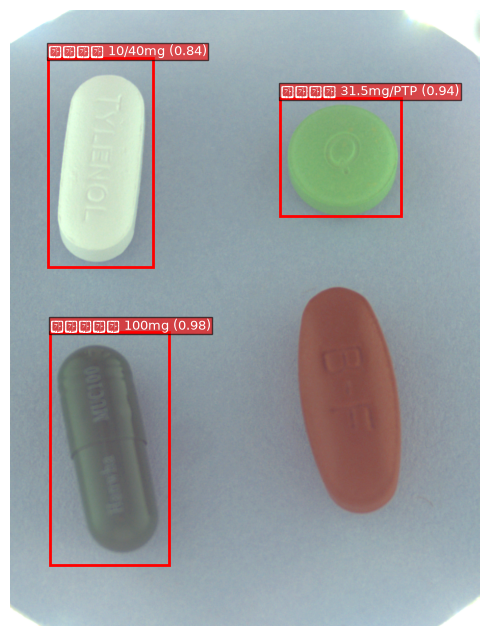

파일명: 874


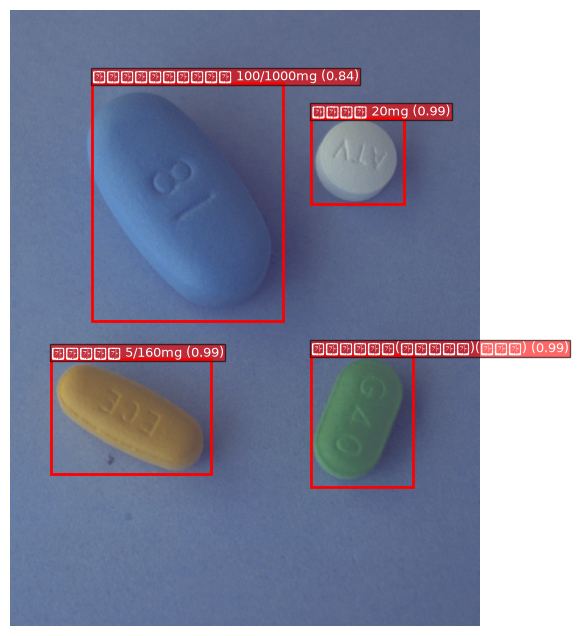

Test Inference:  60%|██████    | 3/5 [00:09<00:05,  2.91s/it]

파일명: 546


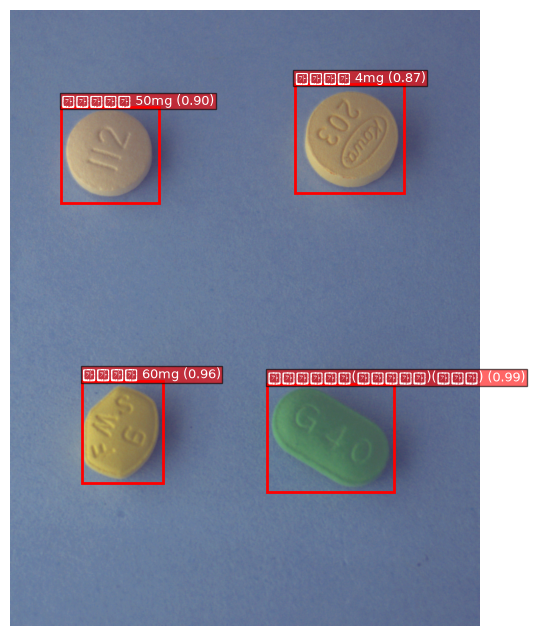

파일명: 1140


c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 51228 (\N{HANGUL SYLLABLE JE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


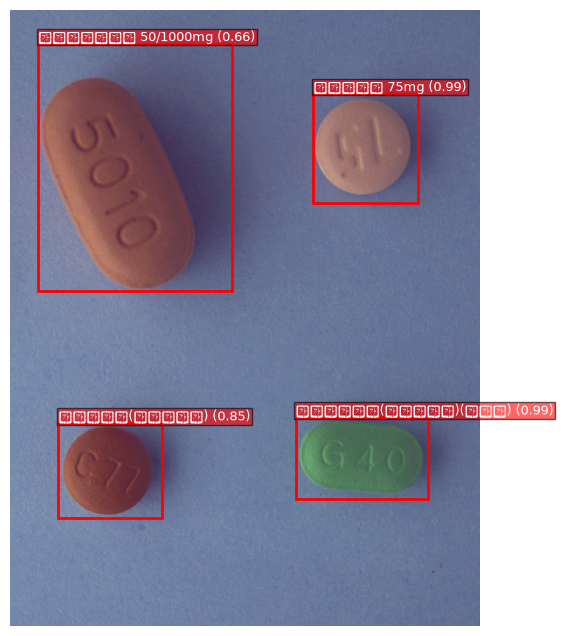

파일명: 612


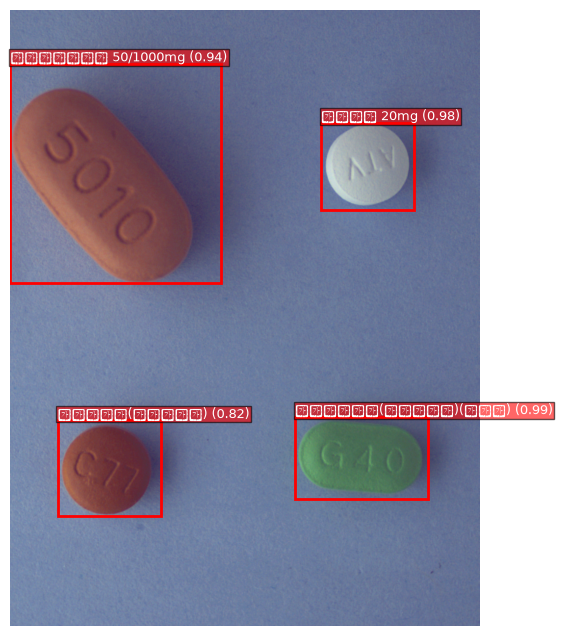

파일명: 346


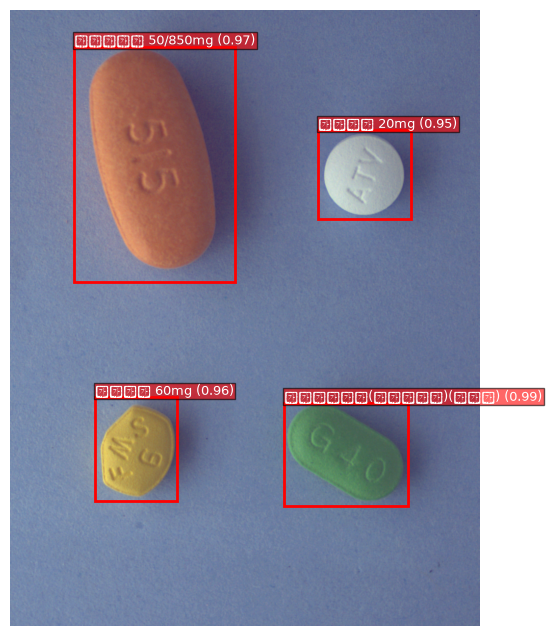

Test Inference:  80%|████████  | 4/5 [00:11<00:02,  2.72s/it]

파일명: 1044


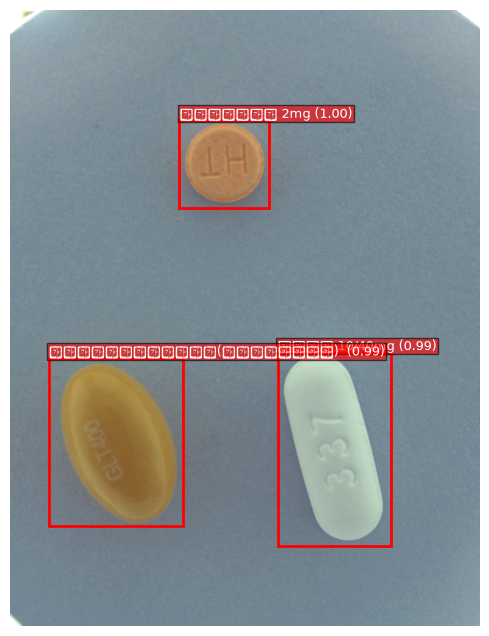

파일명: 1041


c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 47784 (\N{HANGUL SYLLABLE MO}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 51096 (\N{HANGUL SYLLABLE JAL}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 53444 (\N{HANGUL SYLLABLE TAN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


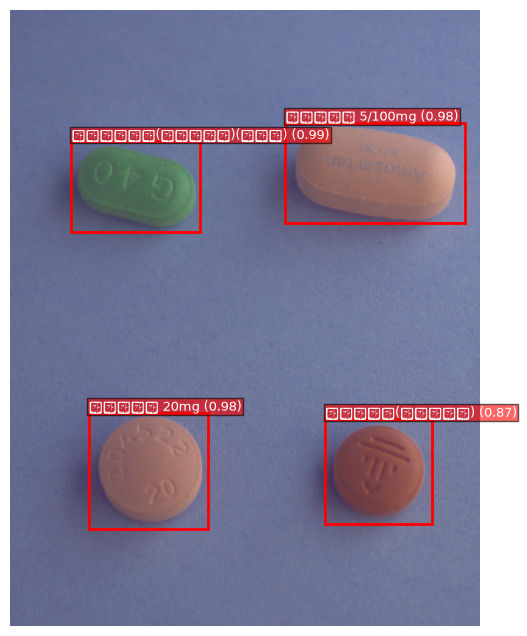

파일명: 1149


c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 48156 (\N{HANGUL SYLLABLE BAL}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


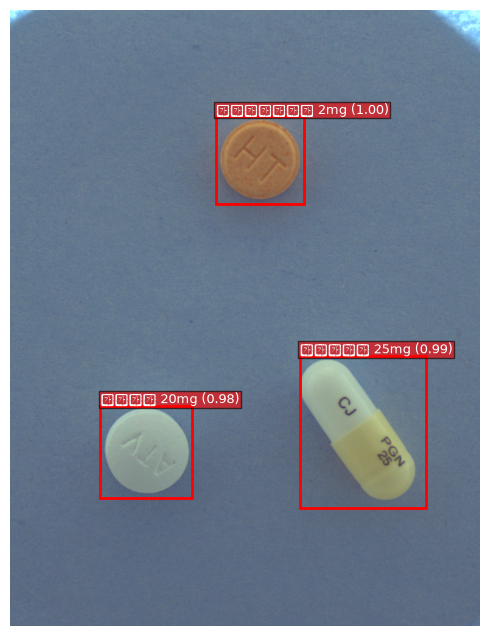

파일명: 1350


c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 50864 (\N{HANGUL SYLLABLE U}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 47113 (\N{HANGUL SYLLABLE REG}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 44600 (\N{HANGUL SYLLABLE GIL}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 49892 (\N{HANGUL SYLLABLE SIL}) missing from f

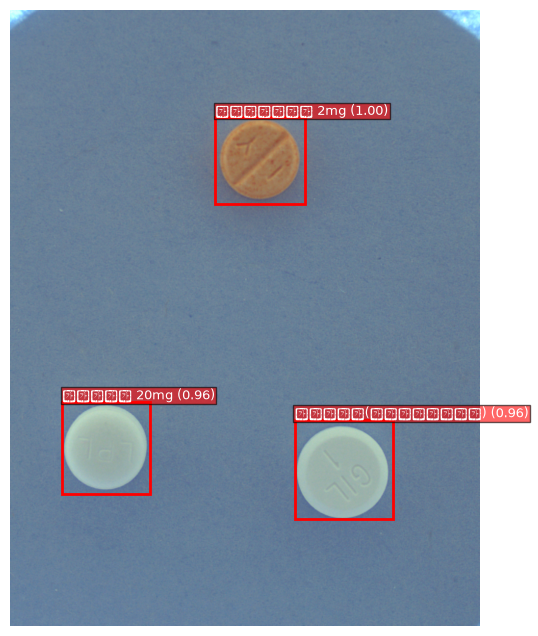

Test Inference: 100%|██████████| 5/5 [00:14<00:00,  2.85s/it]


In [29]:
#@title Test 이미지 20장 추론 및 시각화
model.load_state_dict(torch.load(CHECKPOINT_PATH, map_location=device))
model.eval()

with torch.inference_mode(), torch.cuda.amp.autocast(enabled=AMP_ENABLED):
    for images, stems, orig_ws, orig_hs in tqdm(test_loader, desc="Test Inference"):
        images = [img.to(device, non_blocking=PIN_MEMORY) for img in images]
        predictions = model(images)

        for img, pred, stem, orig_w, orig_h in zip(images, predictions, stems, orig_ws, orig_hs):
            print(f"파일명: {stem}")
            visualize_prediction(img.cpu(), pred, classes)

In [ ]:
#@title Submission CSV 생성
model_name = "fasterrcnnresnet50_fpn_v2_fast"

model.load_state_dict(torch.load(CHECKPOINT_PATH, map_location=device))
model.to(device)
model.eval()

all_test_paths = sorted(glob.glob(os.path.join(path, "test_images", "*.png")))
all_test_stems = [
    os.path.splitext(os.path.basename(p))[0]
    for p in all_test_paths
]

submission_test_dataset = TestDataset(
    image_dir=os.path.join(path, "test_images"),
    stems=all_test_stems,
    transforms=val_test_transformer
)

submission_test_loader = make_detection_loader(
    submission_test_dataset, batch_size=EVAL_BATCH_SIZE, shuffle=False
)

rows = []
annotation_id = 1
score_thresh = 0.5

with torch.inference_mode(), torch.cuda.amp.autocast(enabled=AMP_ENABLED):
    for images, stems, orig_ws, orig_hs in tqdm(
        submission_test_loader,
        desc="Submission Inference"
    ):
        images = [img.to(device, non_blocking=PIN_MEMORY) for img in images]
        predictions = model(images)

        for pred, stem, orig_w, orig_h in zip(
            predictions, stems, orig_ws, orig_hs
        ):
            image_id = int(stem)

            boxes = pred["boxes"].cpu()
            labels = pred["labels"].cpu()
            scores = pred["scores"].cpu()

            keep = scores >= score_thresh
            boxes = boxes[keep]
            labels = labels[keep]
            scores = scores[keep]

            for box, label, score in zip(boxes, labels, scores):
                x_min, y_min, x_max, y_max = box.tolist()

                x_min = max(0, min(x_min, orig_w))
                x_max = max(0, min(x_max, orig_w))
                y_min = max(0, min(y_min, orig_h))
                y_max = max(0, min(y_max, orig_h))

                bbox_w = x_max - x_min
                bbox_h = y_max - y_min

                if bbox_w <= 0 or bbox_h <= 0:
                    continue

                rows.append([
                    annotation_id,
                    image_id,
                    label_to_category[label.item()],
                    round(x_min, 2),
                    round(y_min, 2),
                    round(bbox_w, 2),
                    round(bbox_h, 2),
                    round(score.item(), 4),
                ])
                annotation_id += 1

submission_filename = f"submission_{model_name}.csv"

with open(submission_filename, "w", newline="", encoding="utf-8") as f:
    writer = csv.writer(f)
    writer.writerow([
        "annotation_id", "image_id", "category_id",
        "bbox_x", "bbox_y", "bbox_w", "bbox_h", "score"
    ])
    writer.writerows(rows)

print(f"총 {len(rows)}개 예측 저장 완료 → {submission_filename}")

C:\Users\yiydg\AppData\Local\Temp\ipykernel_22404\4135115615.py:28: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.inference_mode(), torch.cuda.amp.autocast(enabled=AMP_ENABLED):
Submission Inference: 100%|██████████| 106/106 [03:41<00:00,  2.09s/it]

총 3984개 예측 저장 완료 → submission_fasterrcnnresnet50_fpn_v2_fast.csv


In [31]:
#@title label_to_category 매핑 자체 검증
expected_labels = set(range(1, num_classes))  # background(0) 제외
mapped_labels = set(label_to_category.keys())

print(f"모델이 출력 가능한 라벨 범위: {expected_labels}")
print(f"label_to_category에 존재하는 라벨: {mapped_labels}")
print(f"매핑 누락된 라벨: {expected_labels - mapped_labels}")
print(f"매핑 결과 category_id 샘플 5개: {list(label_to_category.items())[:5]}")

모델이 출력 가능한 라벨 범위: {1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56}
label_to_category에 존재하는 라벨: {1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56}
매핑 누락된 라벨: set()
매핑 결과 category_id 샘플 5개: [(1, 1900), (2, 2483), (3, 3351), (4, 3483), (5, 3544)]
